# **DEEP LEARNING FINAL PROJECT**


### RON KEINAN 203735857






____________________________________________________________________________________________________________________________________________________________________________________

## Part 02 - basic classification with graph ML - Laplacian and Node2Vec

____________________________________________________________________________________________________________________________________________________________________________________

##### **Laplacian: the most important graph operator**


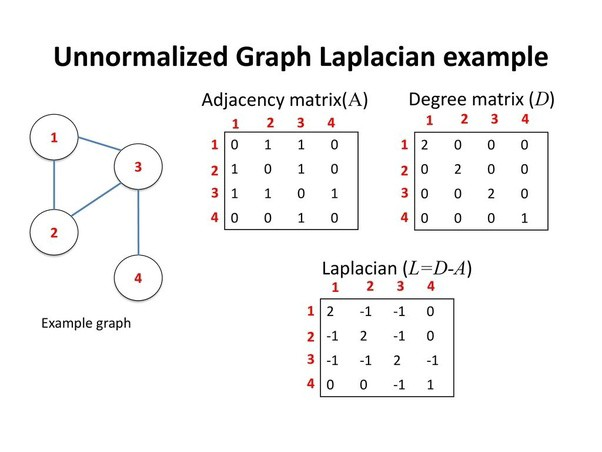

Eigenvalues and eigenvectors of the Laplacian are the graph "frequencies".

###Unormalized: $L = D-A$

## The eigenvectors of L form a basis for any feature on the nodes, and decomposition of the feature as a linear combination of these eigenvectors separates the feature into components ranging from ‘smooth’ to ‘tough’ across the graph.


In [ ]:
import os
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import networkx as nx
%matplotlib inline

In [ ]:
%pip install -q stellargraph
!pip3 install pickle5
import stellargraph as sg
from stellargraph import StellarGraph
from stellargraph.data import BiasedRandomWalk
from stellargraph import datasets
from IPython.display import display, HTML
import pickle5 as pickle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
with open('user_adjacency_matrix.pkl', "rb") as fh:
  adj_mat = pickle.load(fh)
with open('user_feature_matrix.pkl', "rb") as fh:
  feature_mat = pickle.load(fh)
with open('node_subjects_41.pkl', "rb") as fh:
  node_subjects_dict = pickle.load(fh)
users_list = list(feature_mat.keys())

In [ ]:
adj_mat

,משה מיכאלי,אורנה יריב,אייליקו,יובל190,לירי90,Dblonder,דניאל321,עמיק,איציק חיים,דנה צינמן ליטרט,...,נועם21,ספיר בו ארי,שנשן1,Romi weinberg,spring1,shir6,Elad29,חזימק,dave the brave,איריי
משה מיכאלי,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
אורנה יריב,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
אייליקו,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
יובל190,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
לירי90,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
shir6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Elad29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
חזימק,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dave the brave,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
feature_mat

{'לביא שיפמן': array([-0.07936312,  0.1776539 , -0.01359404,  0.05254431, -0.03081165,
        -0.04211425, -0.01193466,  0.08848834, -0.00110687, -0.11825657,
         0.03150761, -0.00648487,  0.12834977, -0.06143375, -0.12099311,
        -0.08854195,  0.0277814 , -0.01954424,  0.06356154,  0.01121283,
         0.02532799, -0.0728427 , -0.017835  , -0.01340876,  0.11070614,
         0.05724833, -0.07006899, -0.05176855, -0.06446061, -0.07465386,
        -0.04455044,  0.01811862, -0.04047392,  0.10020394,  0.04148131,
        -0.00747918, -0.02239763, -0.07433893,  0.06934176, -0.04096877,
        -0.03097013,  0.00926556,  0.01429047, -0.08569276, -0.03673668,
         0.05175055, -0.04321851,  0.04402405, -0.02605789,  0.09270935,
        -0.02343259, -0.04153547,  0.02978357,  0.0013625 , -0.0088727 ,
         0.05060318,  0.02164865,  0.11159804, -0.05766537, -0.04967572,
        -0.02205995, -0.05520091, -0.0471925 ,  0.00307786,  0.01884732,
         0.00672168, -0.02361856,  0.

In [ ]:
node_subjects_dict

{' 1Jacob': 'גמילה מעישון',
 ' 1regev': 'קרוהן וקוליטיס',
 ' 1Shely': 'דיכאון וחרדה',
 ' Adi66': 'ער"ן - עזרה ראשונה נפשית',
 ' banana': 'הפרעות אכילה',
 " Daniel's": 'גמילה מעישון',
 ' Hby': 'כליות ודיאליזה',
 ' Hifa': 'דיכאון וחרדה',
 ' ilyv': 'דיכאון וחרדה',
 ' Jony': 'דיכאון וחרדה',
 ' Keren': 'השמנה',
 ' Lonly134': 'דיכאון וחרדה',
 ' Marinap': 'השמנה',
 ' Morantal': 'שלפוחית רגיזה',
 ' mzd1989': 'ער"ן - עזרה ראשונה נפשית',
 ' nastyaf': 'בעיות גדילה',
 ' אנונימית': 'דיכאון וחרדה',
 ' בת משי': 'גמילה מעישון',
 " ג'ק": 'דיכאון וחרדה',
 ' דונהברברה': 'זכויות החולה',
 ' דפנה': 'סוכרת סוג-2',
 ' זואי.ש': 'מחלות לב',
 ' חגי': 'כאב',
 ' יאיא': 'לחץ דם',
 ' יוחנן 14': 'דיכאון וחרדה',
 ' יעל ענת שוב': 'כאב',
 ' לורה משגב': 'סרטן השד',
 ' מוטי סונגו': 'כאב',
 ' מישהי': 'הפרעות אכילה',
 ' נטלי': 'אוסטאופורוזיס',
 ' עמי 1': 'כאב',
 ' ציפית': 'תרופות ורוקחות',
 ' רותת': 'אוסטאופורוזיס',
 ' רינת': 'תרופות ורוקחות',
 ' שם20': 'דיכאון וחרדה',
 ' תמר': 'בעיות גדילה',
 ':)': 'דיכאון וחרדה',
 '-man-'

In [ ]:
i=0
node_features = {}
for j in feature_mat.values():
  node_features[i]=j
  i += 1

In [ ]:
node_features2=pd.DataFrame.from_dict(node_features, orient='index')

In [ ]:
node_features2

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.079363,0.177654,-0.013594,0.052544,-0.030812,-0.042114,-0.011935,0.088488,-0.001107,-0.118257,...,0.019265,0.049476,0.068810,-0.023148,0.045549,0.078404,0.025368,-0.082066,0.046651,-0.008382
1,-0.070776,0.169057,0.012329,0.128589,-0.047977,-0.018110,-0.035483,0.098511,-0.018471,-0.122035,...,0.032617,0.100679,0.090441,-0.073167,0.080210,0.130015,0.030597,-0.058299,0.016272,-0.039827
2,-0.095276,0.197966,-0.028313,0.098326,-0.032337,-0.007141,-0.035810,0.107801,-0.018322,-0.056584,...,-0.004446,0.113650,0.050531,-0.050060,0.033171,0.114102,-0.017353,-0.097058,0.025192,-0.005947
3,-0.049663,0.136132,-0.034219,0.086193,-0.036854,0.019061,-0.007775,0.136401,-0.015352,-0.094028,...,-0.004518,0.125916,0.044492,-0.006302,0.029985,0.138440,0.008088,-0.055757,0.025885,0.036889
4,-0.018615,0.035545,-0.035801,0.040496,0.052565,-0.010191,-0.014240,0.068285,0.029324,-0.049961,...,-0.020885,0.049769,-0.031553,0.003061,0.043212,0.031985,0.001361,-0.034763,-0.009788,-0.083740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2713,-0.049436,0.187495,0.026946,0.067266,-0.008725,-0.030464,0.008310,0.205939,0.010897,-0.101269,...,0.007408,0.132840,0.083517,-0.079354,0.065178,0.123733,-0.010950,-0.055168,0.027542,0.033386
2714,-0.550960,0.026071,1.311685,0.091568,0.379620,-0.516114,-0.056127,0.615939,0.276557,-0.152301,...,-0.360484,-0.315122,1.015355,0.429403,0.225951,0.128555,-0.063635,0.036399,-0.032223,0.211318
2715,-0.100368,0.248489,-0.062661,0.184977,-0.032892,-0.154458,-0.202165,0.121231,0.120159,-0.003449,...,-0.019587,0.184595,0.016972,0.030899,0.151649,0.019074,0.114247,-0.034741,0.115024,0.057555
2716,-0.138732,0.195776,-0.097274,-0.213478,-0.117400,-0.040885,0.119062,0.169415,0.156920,-0.224291,...,-0.048332,0.234377,0.259634,0.064330,0.117392,0.045559,0.006328,-0.037677,0.107575,0.097743


In [ ]:
A=np.array(adj_mat)
X=np.array(feature_mat)
G=StellarGraph(nx.from_numpy_matrix(A), node_features=node_features2)
node_subjects=pd.Series(node_subjects_dict)
g_nx = sg.StellarDiGraph.to_networkx(G)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: Constructing a StellarGraph directly from a NetworkX graph has been replaced by the `StellarGraph.from_networkx` function
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
print(G.info())

StellarGraph: Undirected multigraph
 Nodes: 2718, Edges: 6790

 Node types:
  default: [2718]
    Features: float32 vector, length 300
    Edge types: default-default->default

 Edge types:
    default-default->default: [6790]
        Weights: range=[1, 74], mean=1.87393, std=2.53118
        Features: none


In [ ]:
print(g_nx)

MultiGraph with 2718 nodes and 6790 edges


# Visualization

In [ ]:
users_and_communities = {}
for usr in users_list:
  if usr in node_subjects.keys():
    users_and_communities[usr] = node_subjects[usr]
  else:
    users_and_communities[usr] = 'nan'
users_and_communities = pd.Series(users_and_communities)

In [ ]:
nodes = list(G.nodes())
label_map = { l: i for i, l in enumerate(np.unique(node_subjects))}
node_colours = [label_map[users_and_communities[target]] for target in users_and_communities.keys()]

In [ ]:
%pip install -q mpld3
import mpld3
mpld3.enable_notebook()

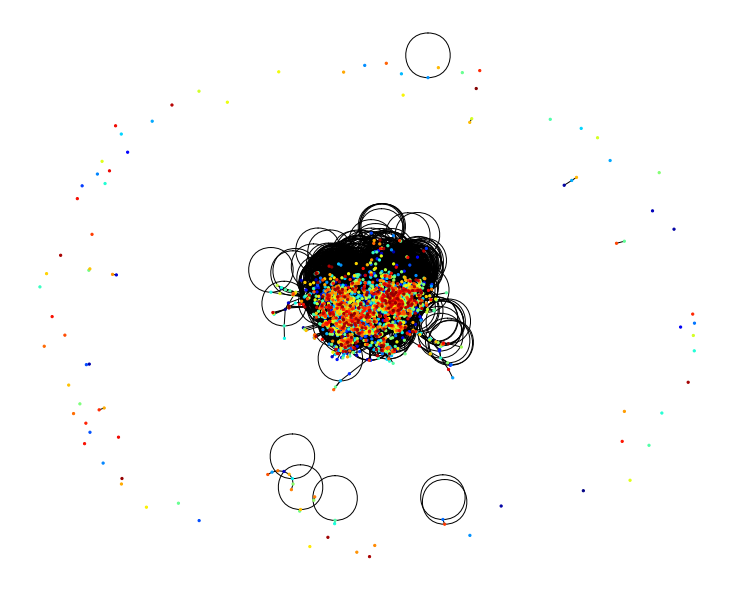

In [ ]:
plt.figure(figsize=(10,8)) 
nx.draw_spring(g_nx, node_size=5, node_color=[i for i in range(2718)], cmap="jet")

In [ ]:
A = G.to_adjacency_matrix(weighted=False).toarray()
print(A)

[[1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
D = np.diag(A.sum(axis=1))
print(D)

[[ 2  0  0 ...  0  0  0]
 [ 0 11  0 ...  0  0  0]
 [ 0  0  9 ...  0  0  0]
 ...
 [ 0  0  0 ...  1  0  0]
 [ 0  0  0 ...  0  1  0]
 [ 0  0  0 ...  0  0  1]]


In [ ]:
L = D-A
print(L)

[[ 1  0  0 ...  0  0  0]
 [ 0 11  0 ...  0  0  0]
 [ 0  0  9 ...  0  0  0]
 ...
 [ 0  0  0 ...  1  0  0]
 [ 0  0  0 ...  0  1  0]
 [ 0  0  0 ...  0  0  1]]


In general, eigenvalues can be complex. Only special types of matrices give rise to real values only. So, we’ll take the real parts only and assume that the dropped complex dimension does not contain significant information.

Let’s also order the eigenvalues from small to large:

The first eigenvalue is as good as zero and this is a general fact; the smallest eigenvalue is always zero. The reason it’s not exactly zero above is because of computational accuracy.
So, we will omit the first eigenvector since it does not convey any information.
We also take a 16-dimensional subspace of the full vector space:

In [ ]:
eigenvalues, eigenvectors = np.linalg.eig(L)

In [ ]:
eigenvalues = np.real(eigenvalues)
eigenvectors = np.real(eigenvectors)

In [ ]:
eigenvalues2 = []
eigenvectors2 = []
users_and_communities2 = {}
us_list = list(users_and_communities.keys())
for i in range(len(eigenvalues)):
  if eigenvalues[i]>0.1:
    eigenvalues2.append(eigenvalues[i])
    eigenvectors2.append(eigenvectors[i])
    users_and_communities2[us_list[i]] = users_and_communities[us_list[i]]

In [ ]:
eigenvalues2 = np.array(eigenvalues2)
eigenvectors2 = np.array(eigenvectors2)

In [ ]:
print(len(eigenvalues2))
print(len(eigenvectors2))

2630
2630


In [ ]:
eigenvalues2[0:10]

array([327.01182335, 154.01963725, 127.17731578, 120.31072373,
       119.03943751, 109.2310334 , 106.71301454, 104.94842467,
       104.02298952, 102.96666251])

In [ ]:
#Let’s also order the eigenvalues from small to large:
order = np.argsort(eigenvalues)
eigenvalues = eigenvalues[order]

In [ ]:
order2 = np.argsort(eigenvalues2)
eigenvalues2 = eigenvalues2[order2]

In [ ]:
eigenvalues[0:10]

array([-1.30385146e-14, -5.88892689e-15, -5.75195070e-15, -3.48036334e-15,
       -1.54753658e-15, -9.46064225e-16, -8.73614478e-16, -6.28878586e-16,
       -3.62641218e-16, -1.75449907e-17])

In [ ]:
eigenvalues2[0:10]

array([0.14813848, 0.15224093, 0.16051036, 0.1636488 , 0.17150991,
       0.17951915, 0.18057199, 0.18744496, 0.19471167, 0.1983373 ])

In [ ]:
embedding_size = 16
v_0 = eigenvectors[:, order[0]] # [ : , 0 ] means [ first_row:last_row , column_0 ]
v = eigenvectors[:, order[1:(embedding_size+1)]]

In [ ]:
embedding_size2 = 16
v_02 = eigenvectors2[:, order2[0]]
v2 = eigenvectors2[:, order2[1:(embedding_size2+1)]]

In [ ]:
v.shape

(2718, 16)

In [ ]:
v2.shape

(2630, 16)

(array([2.525e+03, 6.200e+01, 1.900e+01, 5.000e+00, 5.000e+00, 3.000e+00,
        6.000e+00, 3.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([1.48138485e-01, 1.64913227e+01, 3.28345070e+01, 4.91776912e+01,
        6.55208755e+01, 8.18640597e+01, 9.82072439e+01, 1.14550428e+02,
        1.30893612e+02, 1.47236797e+02, 1.63579981e+02, 1.79923165e+02,
        1.96266349e+02, 2.12609534e+02, 2.28952718e+02, 2.45295902e+02,
        2.61639086e+02, 2.77982271e+02, 2.94325455e+02, 3.10668639e+02,
        3.27011823e+02]),
 <a list of 20 Patch objects>)

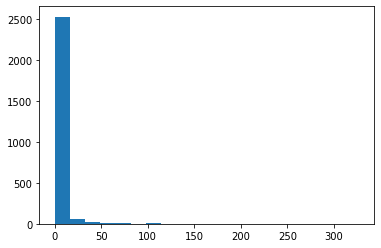

In [ ]:
plt.hist((eigenvalues2),bins=20)

(array([ 14.,  24.,  61.,  96., 943.,  69., 387., 275., 255., 191., 125.,
         73.,  47.,  25.,  19.,  10.,   7.,   7.,   1.,   1.]),
 array([-1.90960774, -1.52462753, -1.13964733, -0.75466713, -0.36968692,
         0.01529328,  0.40027348,  0.78525369,  1.17023389,  1.55521409,
         1.9401943 ,  2.3251745 ,  2.7101547 ,  3.09513491,  3.48011511,
         3.86509531,  4.25007551,  4.63505572,  5.02003592,  5.40501612,
         5.78999633]),
 <a list of 20 Patch objects>)

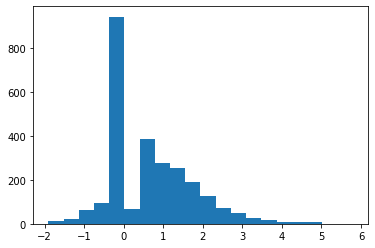

In [ ]:
plt.hist(np.log(eigenvalues2),bins=20)

#Spectrum Properties: 





The largest eigenvalue of the Laplacian spectrum provides information on the level of “bipartiteness” of (subparts of) a network. A (sub)network is said to be (fully) bipartite if its nodes can be divided into two groups in such a way that nodes within the same group are not connected.


*   The first eigenvalues reflect community structure with smaller first eigenvalues indicating stronger community structures.

*   Repeated addition and duplication of nodes and motifs with the same connectivity patterns, has been shown to result in an increase in the eigenvalue λ = 1 of the spectrum 


*   The largest eigenvalue of the Laplacian spectrum provides information on the level of “bipartiteness” of (subparts of) a network. A (sub)network is said to be (fully) bipartite if its nodes can be divided into two groups in such a way that nodes within the same group are not connected.





#Plot a low eigenvector base

In [ ]:
v = eigenvectors[:, order[2]]

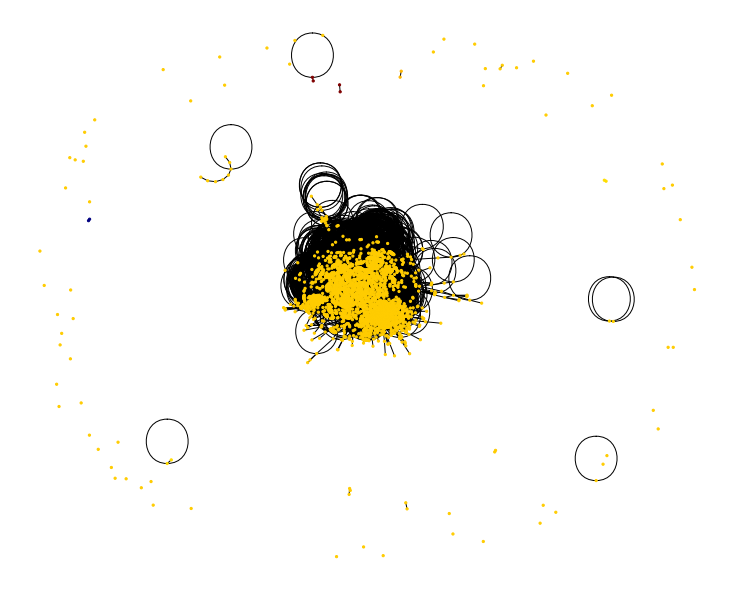

In [ ]:
plt.figure(figsize=(10,8)) 
nx.draw_spring(g_nx, node_size=5, node_color=v, vmin=np.min(v), vmax=np.max(v),cmap="jet")



#Embeddings visualization

In [ ]:
#v = eigenvectors[:, order[1:(embedding_size+1)]]
v = eigenvectors[:, order[len(eigenvectors)-(embedding_size+1):len(eigenvectors)-1]]

In [ ]:
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
v_pr = tsne.fit_transform(v)

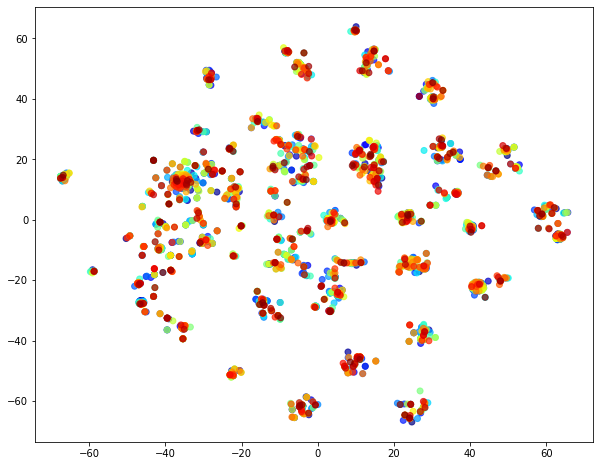

In [ ]:
alpha=0.7
fig = plt.figure(figsize=(10,8))
plt.scatter(v_pr[:,0],
            v_pr[:,1],
            c=[i for i in range(len(eigenvectors))], 
            cmap="jet", alpha=alpha)

We see that the eigenvectors of the Laplacian form clusters corresponding to the target labels. It means that in principle we can train a model using the eigenvectors and make predictions about an unseen graphs. Simply said, given an unlabelled graph we can extract its Laplacian, feed it to the model and get labels for the nodes.

#Training a classifier
The eigenvectors are from the point of view of machine learning just ordinary feature vectors. Taking a training and test set really means in this case taking a subset of the nodes (a subgraph) even though on a code level it’s just an ordinary classifier.

In [ ]:
X = v
Y = (np.array(list(users_and_communities.to_dict().values())))
clf = RandomForestClassifier(n_estimators=300, min_samples_leaf=4)
X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.1, random_state=42)
clf.fit(X_train, y_train)
RandomForestClassifier()
print("score on X_train {}".format(clf.score(X_train, y_train)))
print("score on X_test {}".format(clf.score(X_test, y_test)))

score on X_train 0.5756457564575646
score on X_test 0.4585206375153249


#Node2vec embeddings

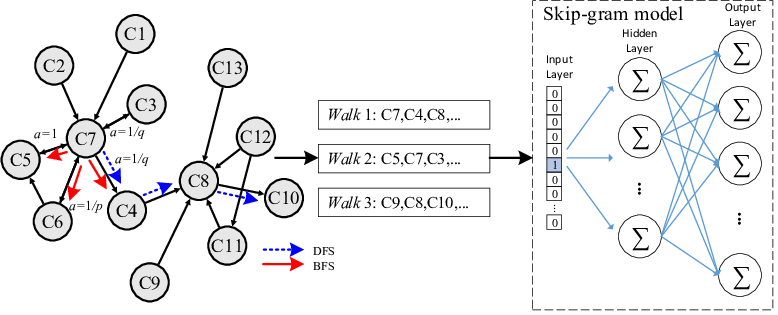

## The Node2Vec algorithm

The Node2Vec algorithm introduced in [1] is a 2-step representation learning algorithm. The two steps are,

1. Use second-order random walks to generate sentences from a graph. A sentence is a list of node ids. The set of all sentences makes a corpus.

2. The corpus is then used to learn an embedding vector for each node in the graph. Each node id is considered a unique word/token in a dictionary that has size equal to the number of nodes in the graph. The Word2Vec algorithm [2], is used for calculating the embedding vectors.


## Corpus generation using random walks

The stellargraph library provides an implementation for second-order random walks as required by Node2Vec. The random walks have fixed maximum length and are controlled by two parameters `p` and `q`. See [1] for a detailed description of these parameters. 

We are going to start 10 random walks from each node in the graph with a length up to 100. We set parameter `p` to 0.5 and `q` to 2.0.

In [ ]:
rw = BiasedRandomWalk(G)

walks = rw.run(
    nodes=list(G.nodes()),  # root nodes
    length=100,  # maximum length of a random walk
    n=10,  # number of random walks per root node
    p=0.5,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=2.0,  # Defines (unormalised) probability, 1/q, for moving away from source node
)
print("Number of random walks: {}".format(len(walks)))

Number of random walks: 27180


## Representation Learning using Word2Vec

We use the `Word2Vec` [2], implementation in the free Python library `Gensim` [3], to learn representations for each node in the graph. It works with `str` tokens, but the graph has integer IDs, so they're converted to `str` here.

We set the dimensionality of the learned embedding vectors to 32 as in [1].

In [ ]:
from gensim.models import Word2Vec

str_walks = [[str(n) for n in walk] for walk in walks]
model = Word2Vec(str_walks, size=16, window=5, min_count=0, sg=1, workers=2, iter=1)

## Visualise Node Embeddings

We retrieve the `Word2Vec` node embeddings that are 128-dimensional vectors and then we project them down to 2 dimensions using the [t-SNE](http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) algorithm.

In [ ]:
# Retrieve node embeddings and corresponding subjects
node_ids = model.wv.index2word  # list of node IDs
node_embeddings = (
    model.wv.vectors
)  # numpy.ndarray of size number of nodes times embeddings dimensionality
node_targets = node_subjects[[int(node_id) for node_id in node_ids]]

In [ ]:
# Apply t-SNE transformation on node embeddings
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
node_embeddings_2d = tsne.fit_transform(node_embeddings)

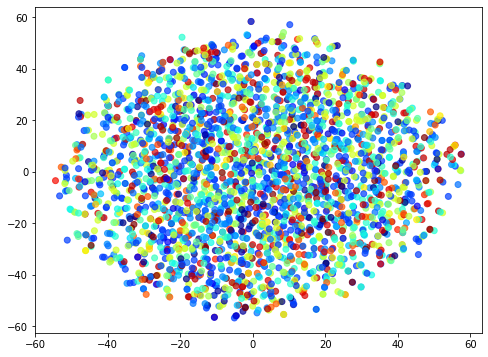

In [ ]:
# draw the points
alpha = 0.7
label_map = {l: i for i, l in enumerate(np.unique(node_targets))}
node_colours = [label_map[target] for target in node_targets]

plt.figure(figsize=(8,6))
plt.scatter(
    node_embeddings_2d[:, 0],
    node_embeddings_2d[:, 1],
    c=node_colours,
    cmap="jet",
    alpha=alpha,
)

In [ ]:
X = node_embeddings_2d
Y = np.array(node_targets)
clf = RandomForestClassifier(n_estimators=300, min_samples_leaf=4)
X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.1, random_state=42)
clf.fit(X_train, y_train)
RandomForestClassifier()
print("score on X_train {}".format(clf.score(X_train, y_train)))
print("score on X_test {}".format(clf.score(X_test, y_test)))

score on X_train 0.5682656826568265
score on X_test 0.13077237433592154
